<a href="https://colab.research.google.com/github/junhuk1113/AIAD_weather/blob/master/Convlstm_model_validator.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import os
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

import io
import imageio
from IPython.display import Image, display
from ipywidgets import widgets, Layout, HBox

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Download and load the dataset.
"""
fpath = keras.utils.get_file(
    "moving_mnist.npy",
    "http://www.cs.toronto.edu/~nitish/unsupervised_video/mnist_test_seq.npy",
)
"""
fpath = "/content/drive/MyDrive/PBL_Shared_Data/202101cldcr200re64new.npy"
dataset = np.load(fpath)
print(dataset.shape)
# Swap the axes representing the number of frames and number of data samples.
#dataset = np.swapaxes(dataset, 0, 1)
# We'll pick out 1000 of the 10000 total examples and use those.
#dataset = dataset[:1000, ...]
# Add a channel dimension since the images are grayscale.
dataset = np.expand_dims(dataset, axis=-1)

# Split into train and validation sets using indexing to optimize memory.
indexes = np.arange(dataset.shape[0])
#np.random.shuffle(indexes)
train_index = indexes[: int(0.9 * dataset.shape[0])]
val_index = indexes[int(0.9 * dataset.shape[0]) :]
train_dataset = dataset[train_index]
val_dataset = dataset[val_index]

# Normalize the data to the 0-1 range.
train_dataset = train_dataset / 255
val_dataset = val_dataset / 255

# We'll define a helper function to shift the frames, where
# `x` is frames 0 to n - 1, and `y` is frames 1 to n.
def create_shifted_frames(data):
    x = data[:, 0 : data.shape[1] - 1, :, :]
    y = data[:, 1 : data.shape[1], :, :]
    return x, y

# Apply the processing function to the datasets.
x_train, y_train = create_shifted_frames(train_dataset)
x_val, y_val = create_shifted_frames(val_dataset)

# Inspect the dataset.
print("Training Dataset Shapes: " + str(x_train.shape) + ", " + str(y_train.shape))
print("Validation Dataset Shapes: " + str(x_val.shape) + ", " + str(y_val.shape))

(31, 24, 64, 64)
Training Dataset Shapes: (27, 23, 64, 64, 1), (27, 23, 64, 64, 1)
Validation Dataset Shapes: (4, 23, 64, 64, 1), (4, 23, 64, 64, 1)


In [18]:
kernels = [[5,3,1],[4,2,1],[3,2,1],[6,3,1]]
filters = [16,32]
batchs = [4,5,8,16,32]

models = []
file_paths = []
input_path = "/content/drive/MyDrive/Tmodels/"

for filename in os.listdir(input_path):
      file_path = os.path.join(input_path,filename)
      print(file_path)
      file_paths.append(file_path)
      models.append(tf.keras.models.load_model(file_path))


/content/drive/MyDrive/Tmodels/filter_64_kernel_[5, 3, 1]_batch_4.h5
/content/drive/MyDrive/Tmodels/filter_64_kernel_[5, 3, 1]_batch_5.h5
/content/drive/MyDrive/Tmodels/filter_64_kernel_[5, 3, 1]_batch_8.h5
/content/drive/MyDrive/Tmodels/filter_16_kernel_[5, 3, 1]_batch_4.h5
/content/drive/MyDrive/Tmodels/filter_16_kernel_[5, 3, 1]_batch_5.h5
/content/drive/MyDrive/Tmodels/filter_16_kernel_[5, 3, 1]_batch_8.h5
/content/drive/MyDrive/Tmodels/filter_16_kernel_[5, 3, 1]_batch_16.h5
/content/drive/MyDrive/Tmodels/filter_16_kernel_[5, 3, 1]_batch_32.h5
/content/drive/MyDrive/Tmodels/filter_16_kernel_[4, 2, 1]_batch_4.h5
/content/drive/MyDrive/Tmodels/filter_16_kernel_[4, 2, 1]_batch_5.h5
/content/drive/MyDrive/Tmodels/filter_16_kernel_[4, 2, 1]_batch_8.h5
/content/drive/MyDrive/Tmodels/filter_16_kernel_[4, 2, 1]_batch_16.h5
/content/drive/MyDrive/Tmodels/filter_16_kernel_[4, 2, 1]_batch_32.h5
/content/drive/MyDrive/Tmodels/filter_16_kernel_[3, 2, 1]_batch_4.h5
/content/drive/MyDrive/Tmodels

1/1 [==============================] - 1s 1s/step
/content/drive/MyDrive/Tmodels/filter_64_kernel_[5, 3, 1]_batch_4.h5


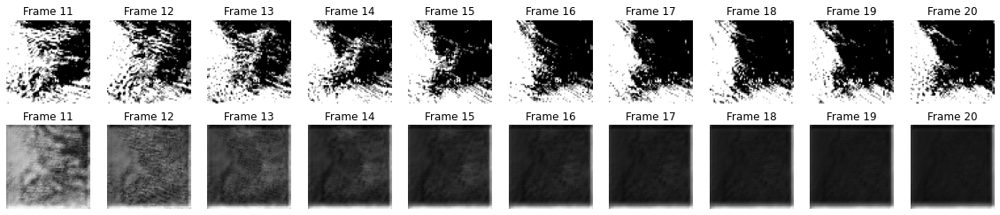

1/1 [==============================] - 1s 1s/step
/content/drive/MyDrive/Tmodels/filter_64_kernel_[5, 3, 1]_batch_5.h5


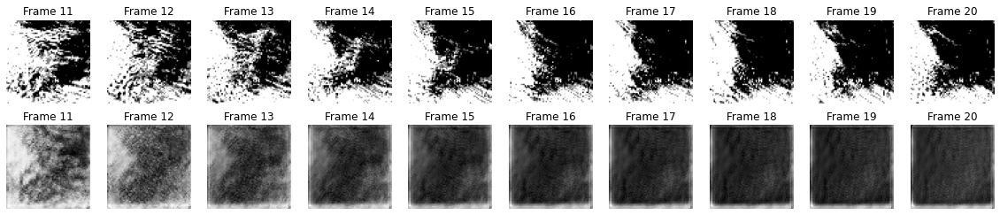

1/1 [==============================] - 1s 1s/step
/content/drive/MyDrive/Tmodels/filter_64_kernel_[5, 3, 1]_batch_8.h5


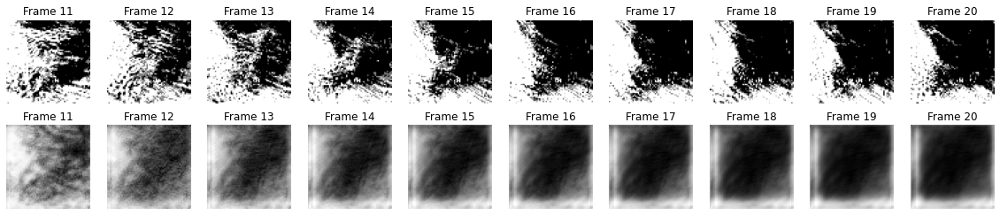

1/1 [==============================] - 0s 329ms/step
/content/drive/MyDrive/Tmodels/filter_16_kernel_[5, 3, 1]_batch_4.h5


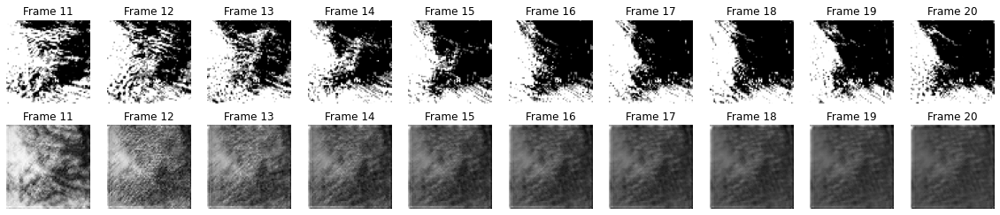

1/1 [==============================] - 0s 332ms/step
/content/drive/MyDrive/Tmodels/filter_16_kernel_[5, 3, 1]_batch_5.h5


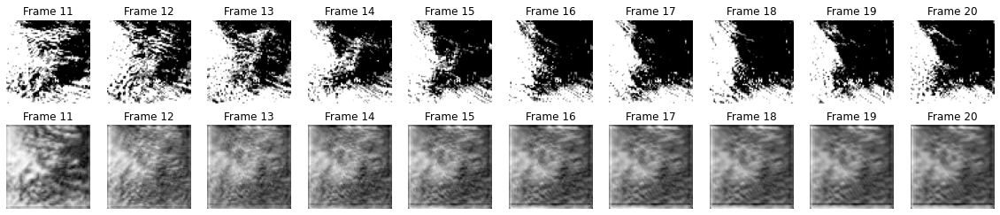

1/1 [==============================] - 0s 337ms/step
/content/drive/MyDrive/Tmodels/filter_16_kernel_[5, 3, 1]_batch_8.h5


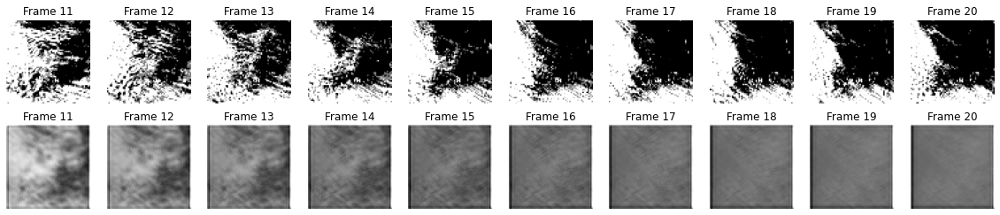

1/1 [==============================] - 0s 339ms/step
/content/drive/MyDrive/Tmodels/filter_16_kernel_[5, 3, 1]_batch_16.h5


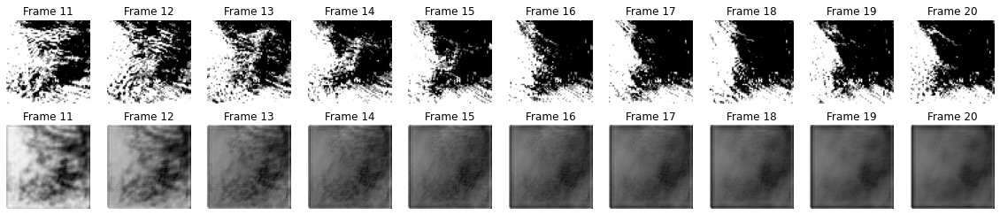

1/1 [==============================] - 0s 326ms/step
/content/drive/MyDrive/Tmodels/filter_16_kernel_[5, 3, 1]_batch_32.h5


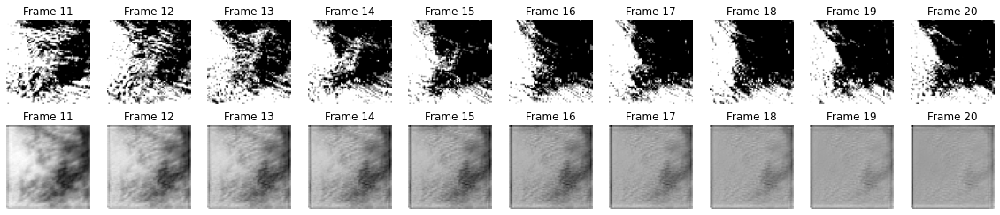

1/1 [==============================] - 0s 282ms/step
/content/drive/MyDrive/Tmodels/filter_16_kernel_[4, 2, 1]_batch_4.h5


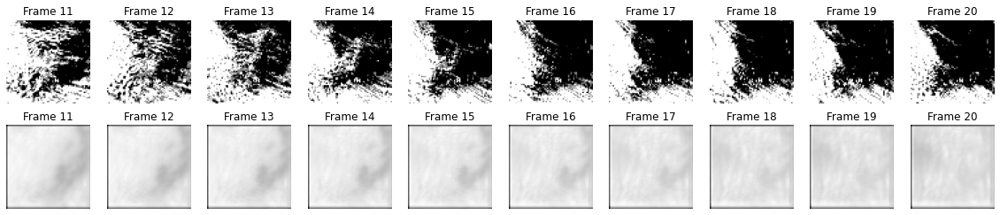

1/1 [==============================] - 0s 284ms/step
/content/drive/MyDrive/Tmodels/filter_16_kernel_[4, 2, 1]_batch_5.h5


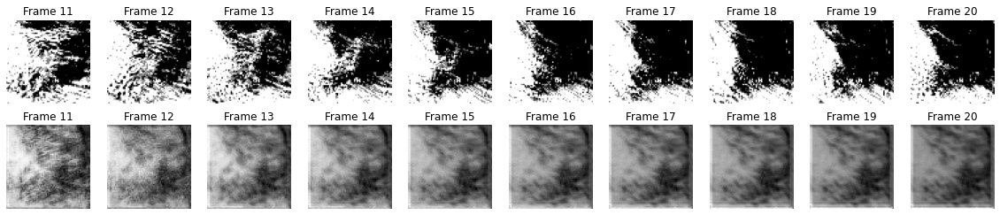

1/1 [==============================] - 0s 301ms/step
/content/drive/MyDrive/Tmodels/filter_16_kernel_[4, 2, 1]_batch_8.h5


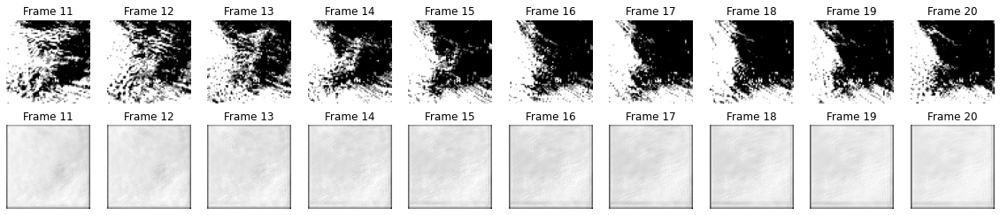

1/1 [==============================] - 0s 359ms/step
/content/drive/MyDrive/Tmodels/filter_16_kernel_[4, 2, 1]_batch_16.h5


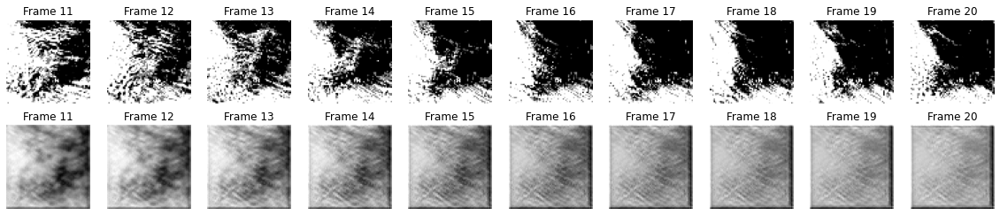

1/1 [==============================] - 0s 372ms/step
/content/drive/MyDrive/Tmodels/filter_16_kernel_[4, 2, 1]_batch_32.h5


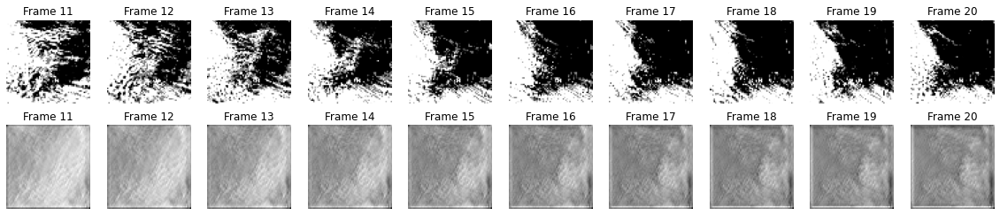

1/1 [==============================] - 0s 342ms/step
/content/drive/MyDrive/Tmodels/filter_16_kernel_[3, 2, 1]_batch_4.h5


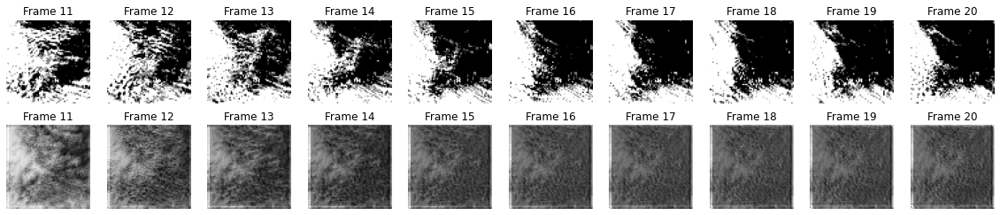

1/1 [==============================] - 0s 376ms/step
/content/drive/MyDrive/Tmodels/filter_16_kernel_[3, 2, 1]_batch_5.h5


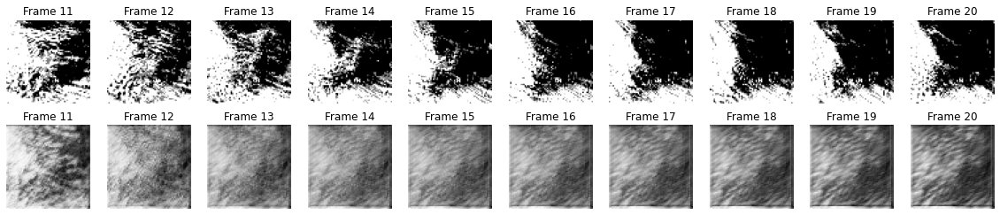

1/1 [==============================] - 0s 264ms/step
/content/drive/MyDrive/Tmodels/filter_16_kernel_[3, 2, 1]_batch_8.h5


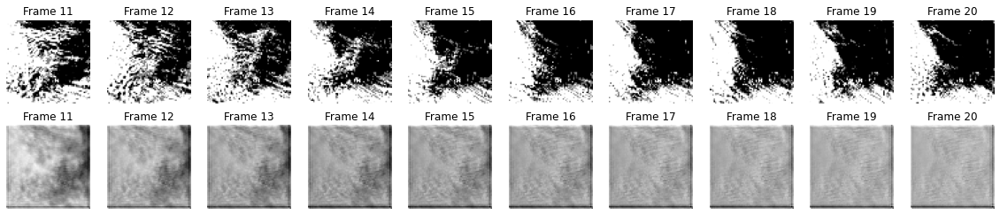

1/1 [==============================] - 0s 272ms/step
/content/drive/MyDrive/Tmodels/filter_16_kernel_[3, 2, 1]_batch_16.h5


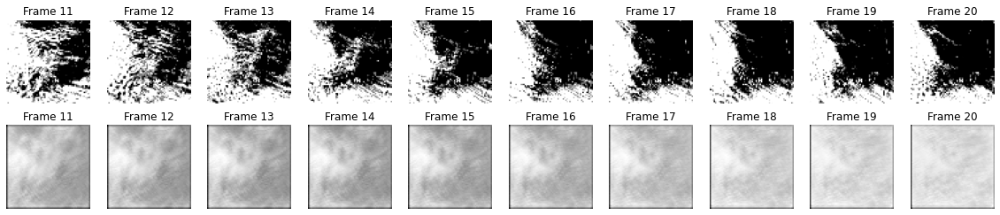

1/1 [==============================] - 0s 267ms/step
/content/drive/MyDrive/Tmodels/filter_16_kernel_[3, 2, 1]_batch_32.h5


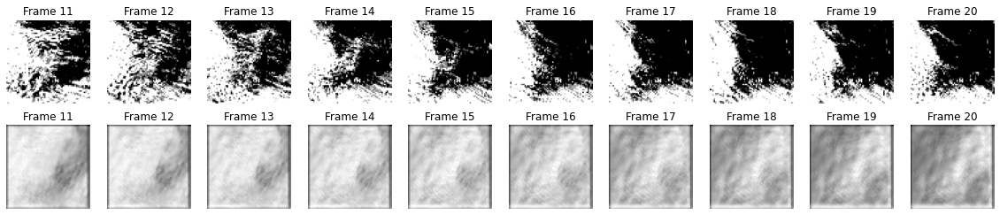

1/1 [==============================] - 0s 383ms/step
/content/drive/MyDrive/Tmodels/filter_16_kernel_[6, 3, 1]_batch_4.h5


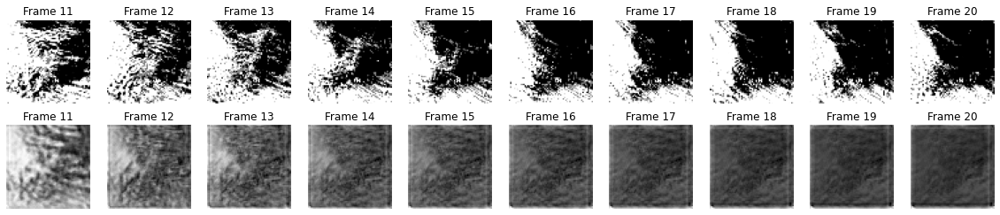

1/1 [==============================] - 0s 387ms/step
/content/drive/MyDrive/Tmodels/filter_16_kernel_[6, 3, 1]_batch_5.h5


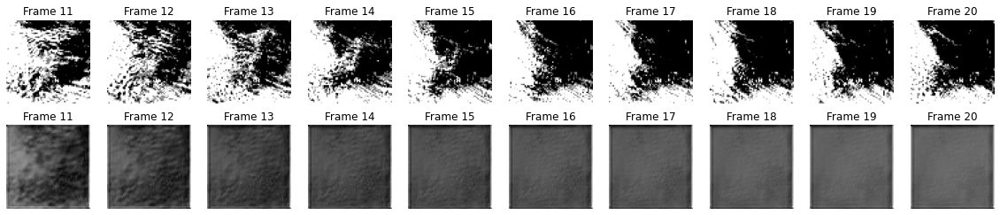

1/1 [==============================] - 0s 391ms/step
/content/drive/MyDrive/Tmodels/filter_16_kernel_[6, 3, 1]_batch_8.h5


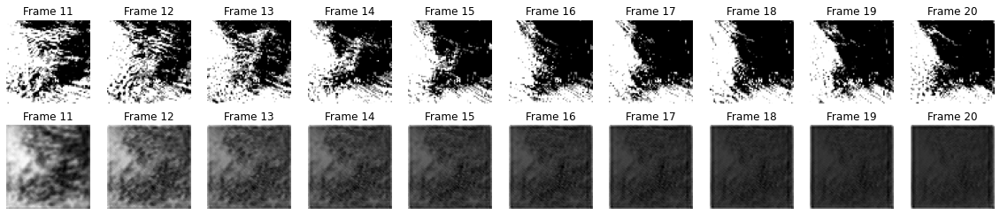

1/1 [==============================] - 0s 392ms/step
/content/drive/MyDrive/Tmodels/filter_16_kernel_[6, 3, 1]_batch_16.h5


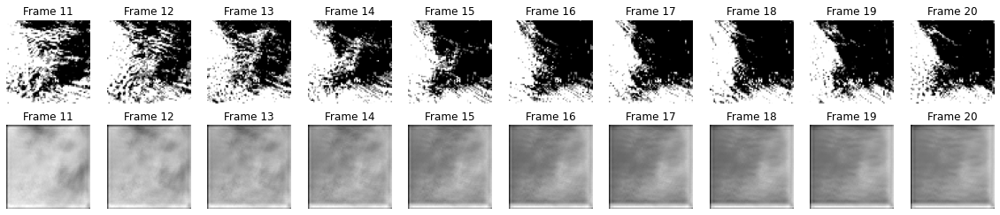

1/1 [==============================] - 0s 369ms/step
/content/drive/MyDrive/Tmodels/filter_16_kernel_[6, 3, 1]_batch_32.h5


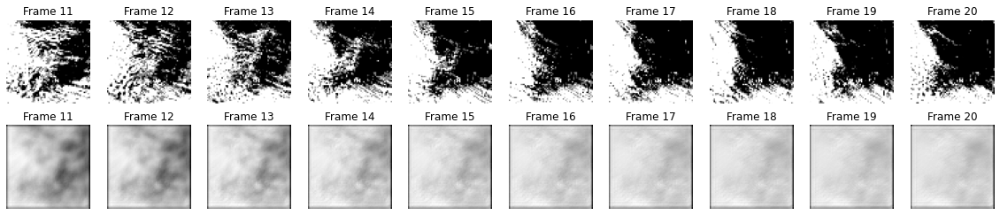

1/1 [==============================] - 1s 594ms/step
/content/drive/MyDrive/Tmodels/filter_32_kernel_[5, 3, 1]_batch_4.h5


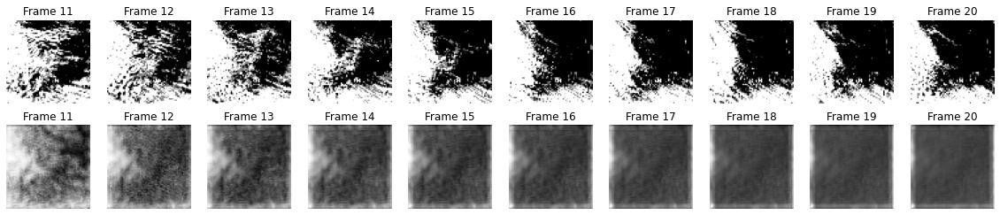

1/1 [==============================] - 1s 617ms/step
/content/drive/MyDrive/Tmodels/filter_32_kernel_[5, 3, 1]_batch_5.h5


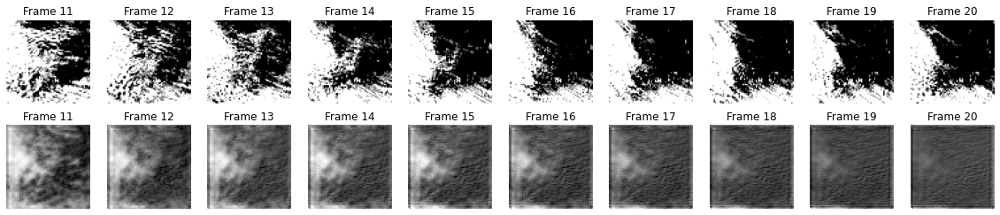

1/1 [==============================] - 1s 610ms/step
/content/drive/MyDrive/Tmodels/filter_32_kernel_[5, 3, 1]_batch_8.h5


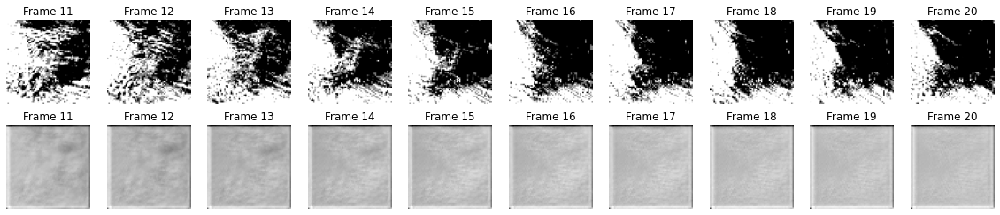

1/1 [==============================] - 1s 628ms/step
/content/drive/MyDrive/Tmodels/filter_32_kernel_[5, 3, 1]_batch_16.h5


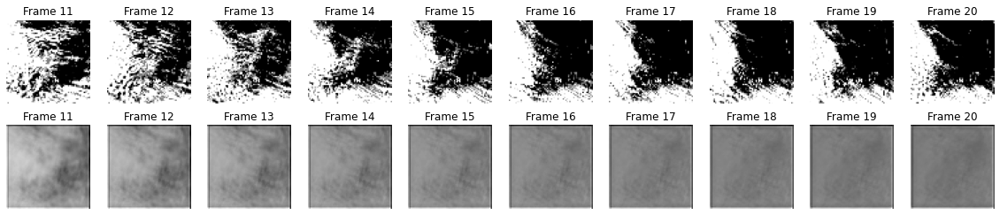

1/1 [==============================] - 1s 598ms/step
/content/drive/MyDrive/Tmodels/filter_32_kernel_[5, 3, 1]_batch_32.h5


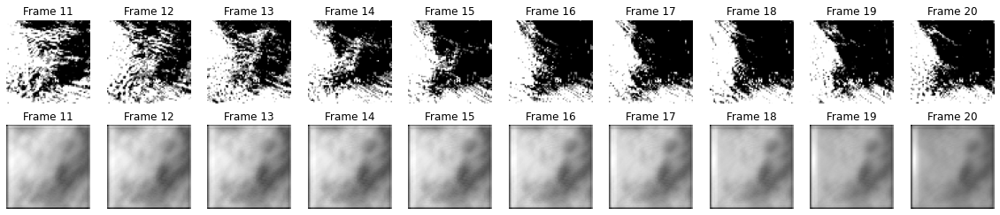

1/1 [==============================] - 0s 439ms/step
/content/drive/MyDrive/Tmodels/filter_32_kernel_[4, 2, 1]_batch_4.h5


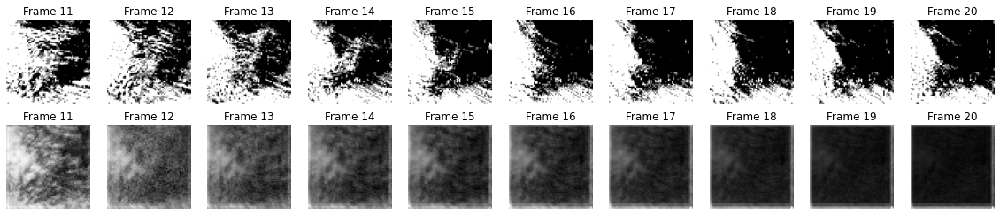

1/1 [==============================] - 1s 604ms/step
/content/drive/MyDrive/Tmodels/filter_32_kernel_[4, 2, 1]_batch_5.h5


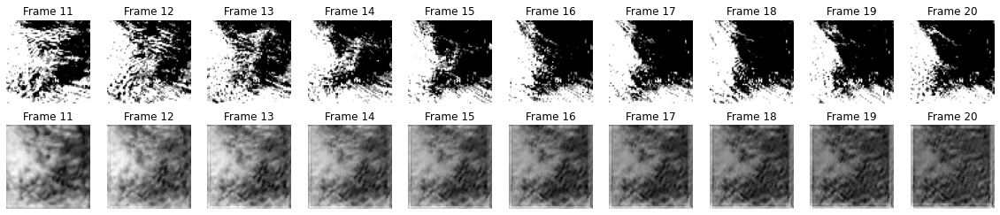

1/1 [==============================] - 0s 485ms/step
/content/drive/MyDrive/Tmodels/filter_32_kernel_[4, 2, 1]_batch_8.h5


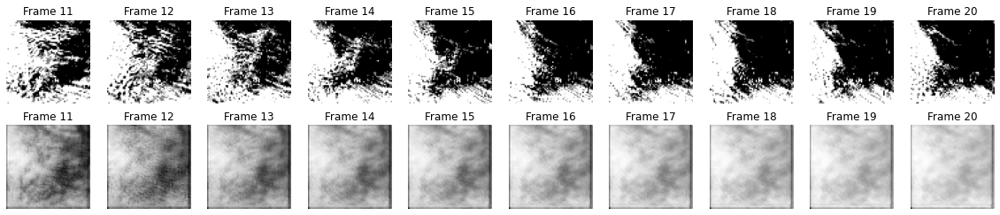

1/1 [==============================] - 0s 470ms/step
/content/drive/MyDrive/Tmodels/filter_32_kernel_[4, 2, 1]_batch_16.h5


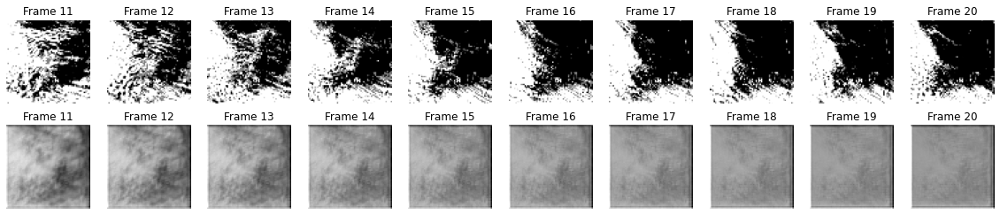

1/1 [==============================] - 0s 469ms/step
/content/drive/MyDrive/Tmodels/filter_32_kernel_[4, 2, 1]_batch_32.h5


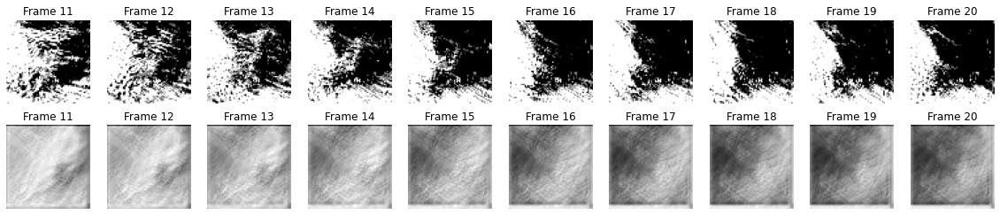

1/1 [==============================] - 0s 431ms/step
/content/drive/MyDrive/Tmodels/filter_32_kernel_[3, 2, 1]_batch_4.h5


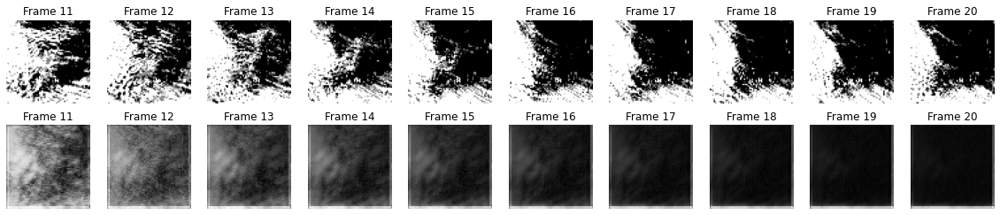

1/1 [==============================] - 0s 435ms/step
/content/drive/MyDrive/Tmodels/filter_32_kernel_[3, 2, 1]_batch_5.h5


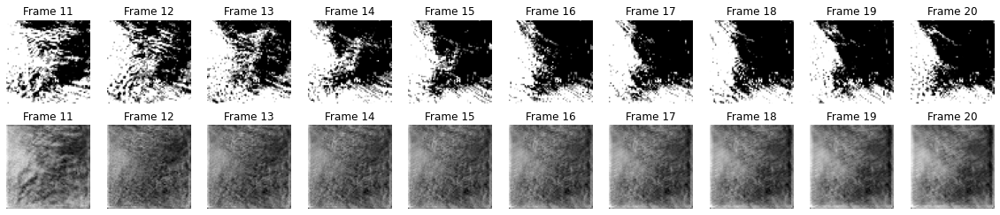

1/1 [==============================] - 0s 429ms/step
/content/drive/MyDrive/Tmodels/filter_32_kernel_[3, 2, 1]_batch_8.h5


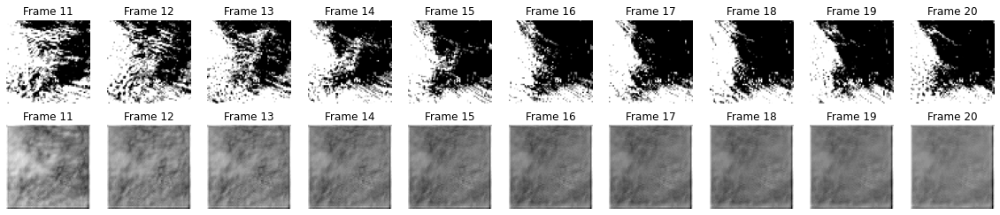

1/1 [==============================] - 0s 424ms/step
/content/drive/MyDrive/Tmodels/filter_32_kernel_[3, 2, 1]_batch_16.h5


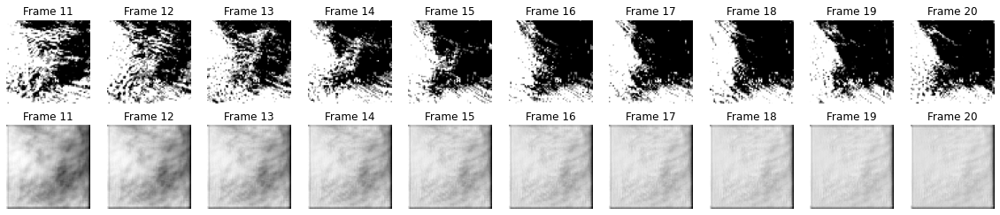

1/1 [==============================] - 0s 409ms/step
/content/drive/MyDrive/Tmodels/filter_32_kernel_[3, 2, 1]_batch_32.h5


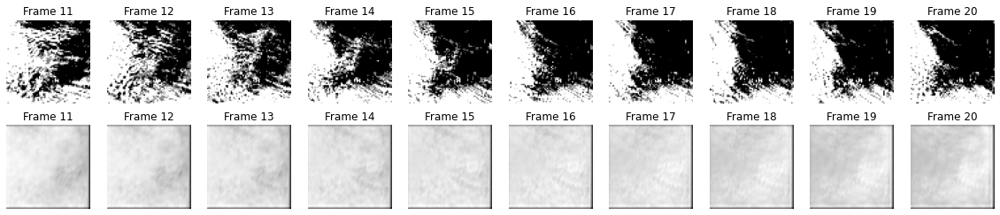

1/1 [==============================] - 1s 711ms/step
/content/drive/MyDrive/Tmodels/filter_32_kernel_[6, 3, 1]_batch_4.h5


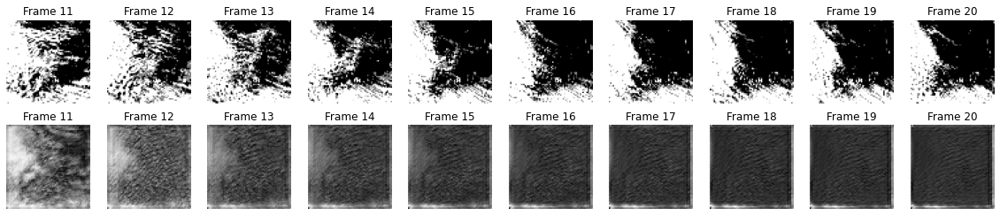

1/1 [==============================] - 1s 693ms/step
/content/drive/MyDrive/Tmodels/filter_32_kernel_[6, 3, 1]_batch_5.h5


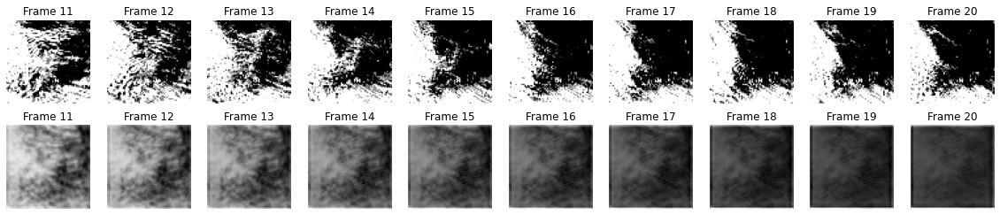

1/1 [==============================] - 1s 692ms/step
/content/drive/MyDrive/Tmodels/filter_32_kernel_[6, 3, 1]_batch_8.h5


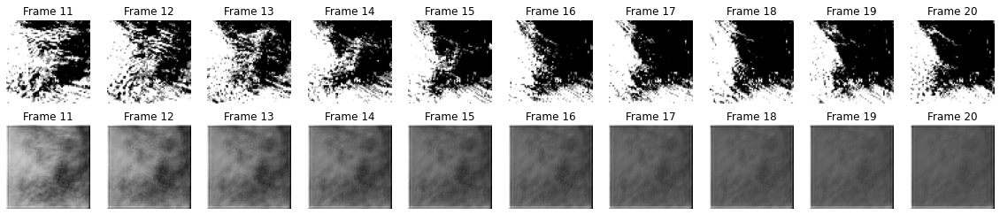

1/1 [==============================] - 1s 712ms/step
/content/drive/MyDrive/Tmodels/filter_32_kernel_[6, 3, 1]_batch_16.h5


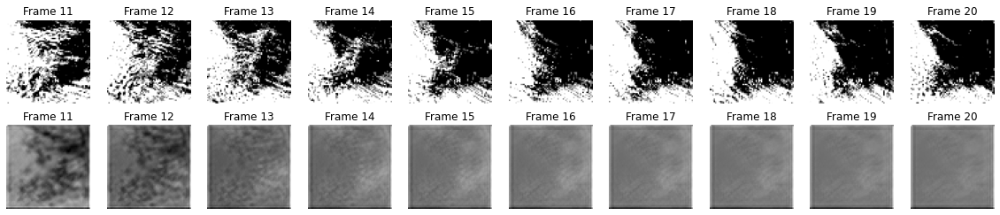

1/1 [==============================] - 1s 702ms/step
/content/drive/MyDrive/Tmodels/filter_32_kernel_[6, 3, 1]_batch_32.h5


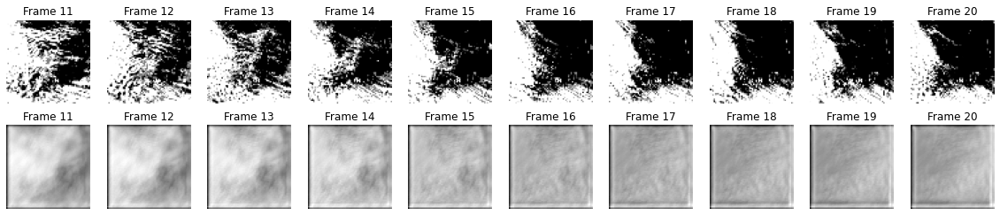

1/1 [==============================] - 1s 816ms/step
/content/drive/MyDrive/Tmodels/filter_64_kernel_[3, 2, 1]_batch_16.h5


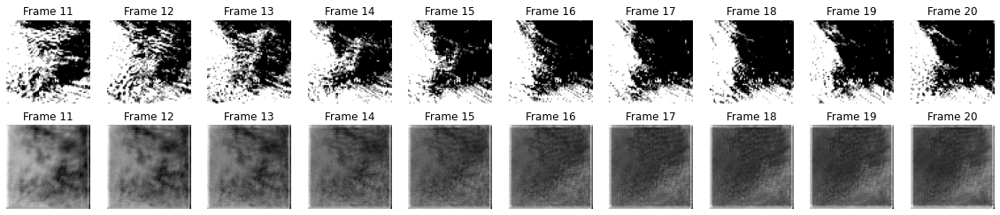

1/1 [==============================] - 1s 802ms/step
/content/drive/MyDrive/Tmodels/filter_64_kernel_[3, 2, 1]_batch_8.h5


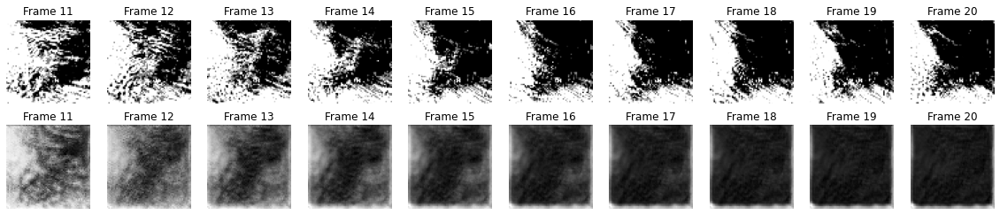

1/1 [==============================] - 1s 806ms/step
/content/drive/MyDrive/Tmodels/filter_64_kernel_[3, 2, 1]_batch_5.h5


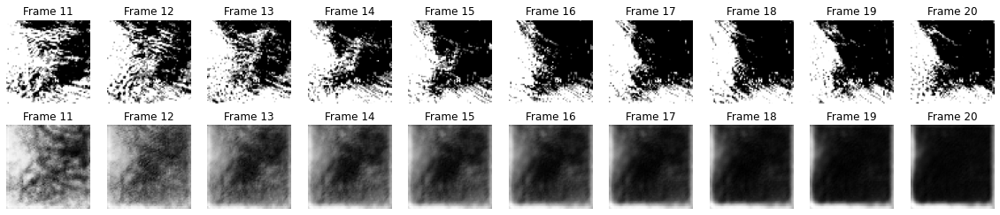

1/1 [==============================] - 1s 820ms/step
/content/drive/MyDrive/Tmodels/filter_64_kernel_[3, 2, 1]_batch_4.h5


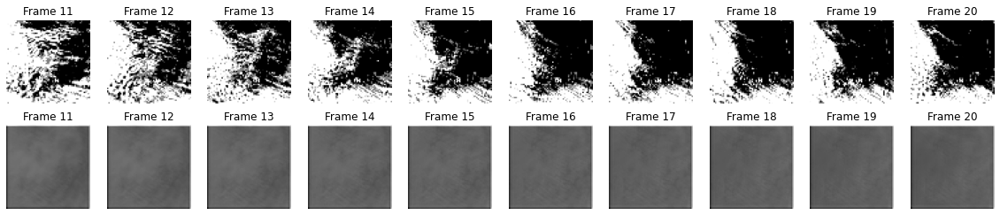

1/1 [==============================] - 2s 2s/step
/content/drive/MyDrive/Tmodels/filter_64_kernel_[6, 3, 1]_batch_4.h5


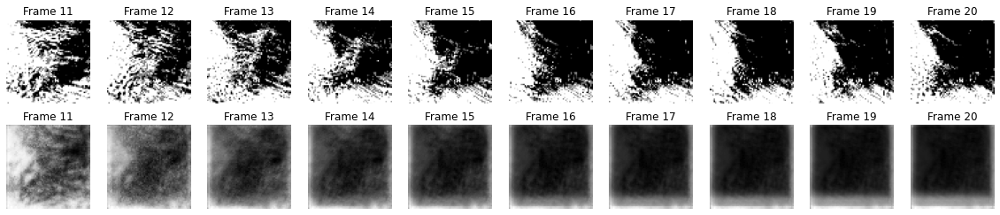

1/1 [==============================] - 1s 1s/step
/content/drive/MyDrive/Tmodels/filter_64_kernel_[5, 3, 1]_batch_16.h5


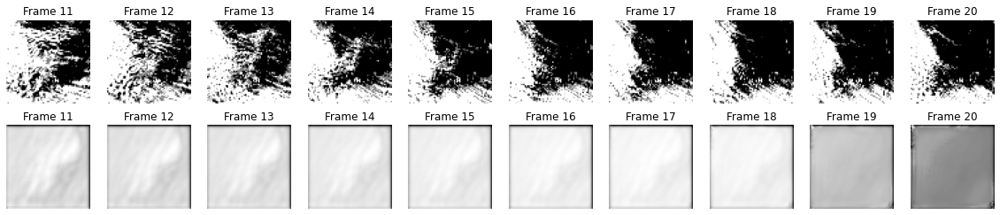

1/1 [==============================] - 1s 983ms/step
/content/drive/MyDrive/Tmodels/filter_64_kernel_[4, 2, 1]_batch_16.h5


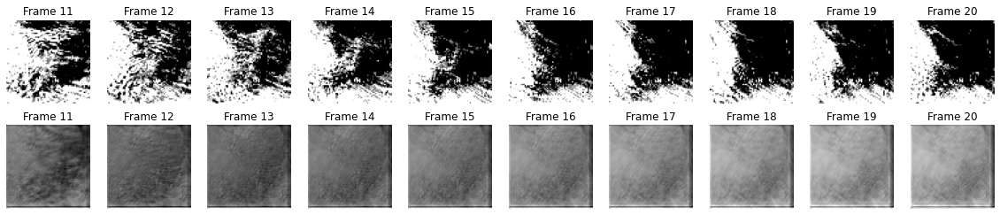

1/1 [==============================] - 1s 1s/step
/content/drive/MyDrive/Tmodels/filter_64_kernel_[4, 2, 1]_batch_8.h5


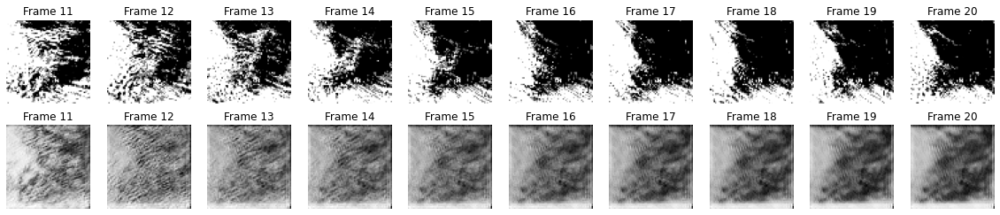

1/1 [==============================] - 1s 992ms/step
/content/drive/MyDrive/Tmodels/filter_64_kernel_[4, 2, 1]_batch_5.h5


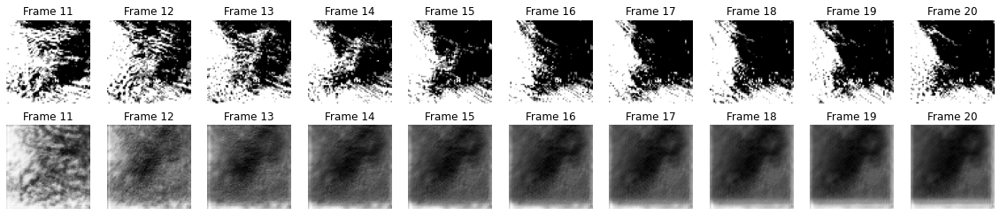

1/1 [==============================] - 1s 1s/step
/content/drive/MyDrive/Tmodels/filter_64_kernel_[4, 2, 1]_batch_4.h5


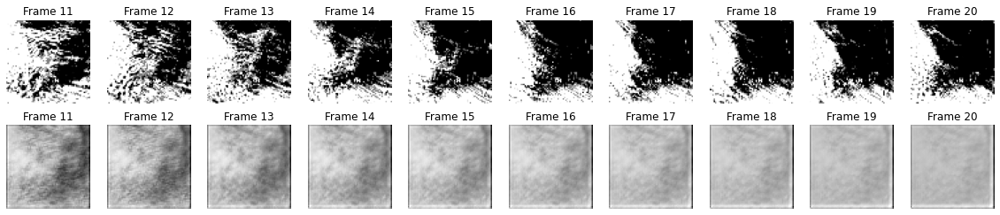

1/1 [==============================] - 2s 2s/step
/content/drive/MyDrive/Tmodels/filter_64_kernel_[6, 3, 1]_batch_16.h5


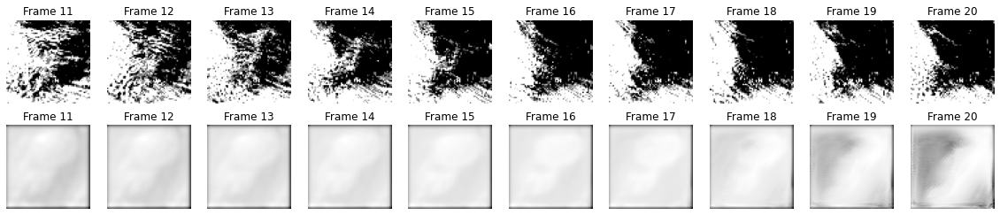

1/1 [==============================] - 2s 2s/step
/content/drive/MyDrive/Tmodels/filter_64_kernel_[6, 3, 1]_batch_8.h5


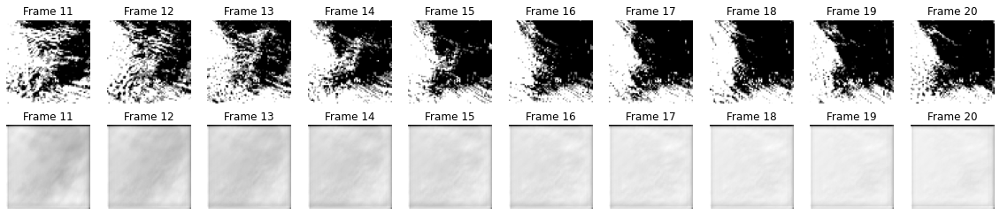

1/1 [==============================] - 2s 2s/step
/content/drive/MyDrive/Tmodels/filter_64_kernel_[6, 3, 1]_batch_5.h5


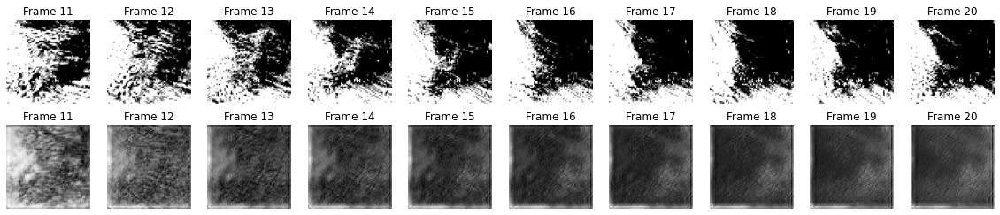

In [23]:
for i in range(len(models)):
# Select a random example from the validation dataset.
  example = val_dataset[0]

  # Pick the first/last ten frames from the example.
  frames = example[:10, ...]
  original_frames = example[10:, ...]

  # Predict a new set of 10 frames.
  for _ in range(10):
      # Extract the model's prediction and post-process it.
      new_prediction = models[i].predict(np.expand_dims(frames, axis=0))
      new_prediction = np.squeeze(new_prediction, axis=0)
      predicted_frame = np.expand_dims(new_prediction[-1, ...], axis=0)

      # Extend the set of prediction frames.
      frames = np.concatenate((frames, predicted_frame), axis=0)

  # Construct a figure for the original and new frames.
  fig, axes = plt.subplots(2, 10, figsize=(20, 4))

  # Plot the original frames.
  for idx, ax in enumerate(axes[0]):
      ax.imshow(np.squeeze(original_frames[idx]), cmap="gray")
      ax.set_title(f"Frame {idx + 11}")
      ax.axis("off")

  # Plot the new frames.
  new_frames = frames[10:, ...]
  for idx, ax in enumerate(axes[1]):
      ax.imshow(np.squeeze(new_frames[idx]), cmap="gray")
      ax.set_title(f"Frame {idx + 11}")
      ax.axis("off")

  # Display the figure.
  print(file_paths[i])
  plt.show()

In [ ]:
# Select a few random examples from the dataset.
examples = val_dataset[np.random.choice(range(len(val_dataset)), size=5)]

# Iterate over the examples and predict the frames.
predicted_videos = []
for example in examples:
    # Pick the first/last ten frames from the example.
    frames = example[:10, ...]
    original_frames = example[10:, ...]
    new_predictions = np.zeros(shape=(10, *frames[0].shape))

    # Predict a new set of 10 frames.
    for i in range(10):
        # Extract the model's prediction and post-process it.
        frames = example[: 10 + i + 1, ...]
        new_prediction = model.predict(np.expand_dims(frames, axis=0))
        new_prediction = np.squeeze(new_prediction, axis=0)
        predicted_frame = np.expand_dims(new_prediction[-1, ...], axis=0)

        # Extend the set of prediction frames.
        new_predictions[i] = predicted_frame

    # Create and save GIFs for each of the ground truth/prediction images.
    for frame_set in [original_frames, new_predictions]:
        # Construct a GIF from the selected video frames.
        current_frames = np.squeeze(frame_set)
        current_frames = current_frames[..., np.newaxis] * np.ones(3)
        current_frames = (current_frames * 255).astype(np.uint8)
        current_frames = list(current_frames)

        # Construct a GIF from the frames.
        with io.BytesIO() as gif:
            imageio.mimsave(gif, current_frames, "GIF", fps=5)
            predicted_videos.append(gif.getvalue())

# Display the videos.
print(" Truth\tPrediction")
for i in range(0, len(predicted_videos), 2):
    # Construct and display an `HBox` with the ground truth and prediction.
    box = HBox(
        [
            widgets.Image(value=predicted_videos[i]),
            widgets.Image(value=predicted_videos[i + 1]),
        ]
    )
    display(box)

 Truth	Prediction
